In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

def string_to_list(string):
    try:
        print(string)
        # Remove '[' and ']' characters, then split the string by whitespace
        parts = string.strip('[]').replace(',', '').replace('j', '').replace('e', '').replace('+', ' ').replace('-', ' ').split()

        # Convert each part to a double and create a list
        result = [float(part) for part in parts]
        return result
    except ValueError as e:
        print(f"Error: {e}")
        return None

# Function to unpack list columns into multiple columns
def unpack_lists(df):
    for col in df.columns:
        if isinstance(df[col][0], list):
            # print(col)
            max_len = max(len(sublist) for sublist in df[col])
            for i in range(max_len):
                df[f'{col}{i}'] = df[col].apply(lambda x: x[i] if len(x) > i else None)
            df.drop(columns=[col], inplace=True)
    return df


def compute_mean_std(col):
    means = col.apply(lambda x: np.mean(x) if isinstance(x, list) else x)
    stds = col.apply(lambda x: np.std(x) if isinstance(x, list) else x)
    return means, stds

def mean_and_std_from_list(df):
  for col in df.columns:
    if df[col].apply(lambda x: isinstance(x, list)).any():
        # Compute mean and std if the column contains lists
        mean_col, std_col = compute_mean_std(df[col])
        df[f'{col}_mean'] = mean_col
        df[f'{col}_std'] = std_col
        df.drop(columns=[col], inplace=True)
    else:
        # Copy the column as-is if it does not contain lists
        df[col] = df[col]

  return df


def load_dataframe_from_csv(file_path, mean_and_std = False):
    df = pd.read_csv(file_path)

    df = df.dropna()

    transformed_df = df.copy()
    for column in df.columns:
        if column != 'label' and column != 'label_1':
            transformed_df[column] = df[column].apply(string_to_list)

    transformed_df = transformed_df.dropna()

    if mean_and_std:
      unpacked_df = mean_and_std_from_list(transformed_df)
    else:
      # Unpack the lists into separate columns
      unpacked_df = unpack_lists(transformed_df)

    unpacked_df = unpacked_df.dropna(axis=1, how='any')

    return unpacked_df


def compute_and_plot_svd(df):
    # Data normalization
    standard_scaler = preprocessing.StandardScaler()

    df_np = df.loc[:, ~df.columns.isin(['label', 'label_1'])].to_numpy()
    df_np = standard_scaler.fit_transform(df_np)

    labels_np = df[['label']].to_numpy().reshape(-1)

    # SVD computation
    U, s, VT = np.linalg.svd(df_np, full_matrices = False)

    # Plotting
    fig, axs = plt.subplots(1,3,figsize=(18,6))

    axs[0].semilogy(s, 'o-')
    axs[0].set_title('singular values')

    axs[1].semilogy(np.cumsum(s) / np.sum(s), 'o-')
    axs[1].set_title('cumulate fraction of singular values')

    axs[2].semilogy(np.cumsum(s**2) / np.sum(s**2), 'o-')
    axs[2].set_title('cumulate fraction of explained varience')

    return U, s, VT, labels_np, df_np

def compute_and_plot_pca(df, df_np, labels_np):
    # PCA
    pca = PCA(n_components=3)
    pc = pca.fit_transform(df_np)

    # Create a figure
    fig = plt.figure(figsize=(14, 6))

    # Create a 2D subplot
    ax_0 = fig.add_subplot(121)  # 1 row, 2 columns, first plot
    ax_1 = fig.add_subplot(122, projection='3d')


    # First two principal components
    for label in df['label'].unique():
      idxs = (labels_np == label)
      ax_0.scatter(pc[idxs, 0], pc[idxs, 1], label = label, s = 15)

    ax_0.legend()
    ax_0.set_title("Fist two principal components")


    # First three principal components
    for label in df['label'].unique():
      idxs = (labels_np == label)
      ax_1.scatter(pc[idxs, 0], pc[idxs, 1], pc[idxs, 2], label = label)

    ax_1.legend()
    ax_1.set_title("Fist three principal components")

    plt.show()

    return pc

# Perform exploration on datasets

## Gtzan

### Acoustic features

In [3]:
acoustic_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/gtzan_acoustic_features.csv'

# af = load_dataframe_from_csv(acoustic_feature_file)
af = load_dataframe_from_csv(acoustic_feature_file, True)

[-222.6293487548828, 109.60015106201172, 8.275423049926758, -2.573467254638672, 9.491744995117188, -11.674646377563477, 15.712113380432129, 4.1387505531311035, 8.33830451965332, 12.610578536987305, -13.010226249694824, -4.639627456665039, 7.661615371704102, 4134.9326171875, 1606.1102294921875, 531.59716796875, 621.3214111328125, 194.82891845703125, 221.13438415527344, 113.59833526611328, 107.56491088867188, 112.60948181152344, 152.1848907470703, 270.7237548828125, 221.02691650390625, 175.96163940429688, -93.10067749023438, 188.995849609375, 104.20809173583984, 59.127281188964844, 44.509300231933594, 28.673128128051758, 50.458221435546875, 31.744722366333008, 32.78627395629883, 44.399593353271484, 17.545190811157227, 30.017913818359375, 45.29177474975586, -382.54779052734375, -35.735633850097656, -35.305335998535156, -59.55237579345703, -36.56833267211914, -55.346466064453125, -16.168746948242188, -21.19597053527832, -21.644166946411133, -24.923730850219727, -48.587127685546875, -39.006

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.28210970869420826, 0.45626906412325585, 0.2225440632275807, 0.20453711024536214, 0.11021270207702642, 0.16073746166260625, 0.16162026257840348, 0.12714101020877486, 0.21445731337836083, 0.17200824159309333, 0.15885541872460113, 0.26063228732186516, 0.6237551074443434, 0.14925992631450938, 0.1503859036899636, 0.19864190525360012, 0.11160295166070629, 0.12827489571059983, 0.16847233258137892, 0.1396560880311274, 0.11478017738047129, 0.12444013427459866, 0.12235839525928825, 0.11032769205045027, 0.23224573261430867, 0.3099244679049799, 0.28035013848000473, 0.1086396951904393, 0.13868066779409763, 0.12062708553639905, 0.12362517852736998, 0.1076146710070811, 0.09781065424851032, 0.15006286264384514, 0.09388272880959199, 0.14379082519988187, 0.11814937698925264, 0.1136423526418661, 0.18132162275909178, 0.2823037674468278, 0.1271713866767922, 0.10894486380238338, 0.11581463514504349, 0.06473703574935603, 0.06593469066686987, 0.10638821807059325, 0.08810358741028584, 0.10221352308101399, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.43442289898415803, 0.2707687940745453, 0.28180866023636625, 0.2753874649355757, 0.2228399535727411, 0.22576021082741063, 0.30635062320803313, 0.30449825687743254, 0.1852645607566533, 0.2670643654071279, 0.23407401189214724, 0.2639405733861326, 0.2390588968808137, 0.12370282673734433, 0.28199033763446407, 0.22606747905685476, 0.18005113124891517, 0.12562625052983856, 0.13210665129534305, 0.1238024018691955, 0.07182290383418066, 0.10786912880539949, 0.13902541538875343, 0.12591274466130983, 0.07485326293822438, 0.10564943368902707, 0.11989714349802716, 0.11197286517339099, 0.16110074959795498, 0.16867086345909774, 0.13634572845852092, 0.05106378613599725, 0.06332981419901912, 0.08437527755377709, 0.08856641964424432, 0.10128490445771478, 0.08061783318894333, 0.07485724461076458, 0.06480777967654222, 0.05094674466123337, 0.0603835120465079, 0.07946587486516014, 0.08343319218888758, 0.06425326843536672, 0.09026438527824936, 0.10521399287101489, 0.07865578993839394, 0.038754737122374726

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[1.8771916357884462, 3.4414401120370606, 3.1501602308246963, 2.52946359306946, 1.8272394289294913, 1.40968209738473, 0.9746890004308143, 0.6684859802304277, 0.5592165664357368, 0.5482548012699451, 0.6903698384898103, 0.7955677820725097, 0.8903542853275191, 0.9415613869361378, 1.0275473823915489, 1.0586285743229729, 1.1975902134272711, 1.016937361974749, 0.7106826753613311, 0.48665446316885924, 0.31961023195395377, 0.1846426569721679, 0.054753004412786875, 0.0011756480587857634, 0.8837153262342555, 2.0312779486051045, 1.3802499448940573, 1.0452125351076171, 0.8102187830555104, 1.01559519000189, 0.6219659718131524, 0.36055572727878027, 0.2419262506013557, 0.2595814657900616, 0.5190207663605758, 0.8200206262288738, 1.0251199443072974, 1.0845983308899407, 1.224828226885532, 1.2487599361330495, 2.030979730991371, 1.450227610246791, 0.9014974553274588, 0.5270951801113041, 0.2849165593647647, 0.11881800262089942, 0.021511417660396815, 8.738801508032866e-07, 1.2672243747454779, 1.143131409415

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.9926969120429865, 1.6941895935485287, 1.8137515417691659, 2.7731229176498444, 3.2002690398828606, 2.403019125887821, 2.0481621256638145, 2.6297531451869967, 2.00742095980741, 1.431290307728434, 1.4646757949853422, 1.2704647328035963, 1.0871587336533102, 0.9567923026159787, 0.8768349258560074, 0.7691212541155057, 0.738752524584885, 0.6777390144475891, 0.5186209522119397, 0.370016529001438, 0.2975168893529507, 0.1786289866265685, 0.020685420035889315, 0.0010663796724683062, 0.351620970093762, 0.38243540198055526, 0.1622648667952357, 0.3382391425439097, 1.0866079259432249, 0.5418737071631503, 0.2417120011013496, 0.6120795306090868, 0.34079595579841393, 0.15070384996978287, 0.3727362622104703, 0.2195523368307489, 0.1336173789418124, 0.07787056173024892, 0.046163865866298, 0.031770940275708266, 0.03477995653947754, 0.04272343274339636, 0.04080629265914058, 0.02216663461754263, 0.015025549042099564, 0.007838535158284633, 0.000879024931833593, 0.0, 0.33253342949400927, 0.3633810525941869,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[11.085204583139658, 6.664576301617046, 5.109196988246106, 5.46524013497107, 3.656245975923372, 1.9579220107881659, 1.4212600336847934, 2.3404224845285717, 3.048256422514042, 3.171628061943731, 2.0386395247874463, 1.8423077652241098, 2.4164616730798403, 2.4229513093134027, 1.57827988417568, 1.1207590125017297, 1.7983931190882803, 1.3881929525256682, 0.79538917883181, 0.722348786629607, 0.5625602884458913, 1.2274723476107767, 1.3716671471413417, 0.9673762926419333, 0.6146416779395196, 1.6169909897282615, 2.043354776010912, 1.86155304974534, 1.0695525310342573, 0.8812275570983479, 0.9329313860495405, 0.8030088039770471, 0.4407807759686261, 0.7179410697897541, 0.591789300664224, 0.5788034517561623, 0.8725141615206216, 0.7023581988434173, 0.8299035678000426, 1.1131049535954116, 1.232543931790754, 1.164380795354803, 0.4925038336844837, 0.6147448233827578, 0.8820621148412329, 0.5082735440467431, 0.45634002051407435, 0.5011151924392085, 0.6268293784786052, 0.8213778582553475, 0.71880766028958

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [4]:
af.head()

,label_1,label,mfcc_mean,mfcc_std,ssd_mean,ssd_std,rh_mean,rh_std,mvd_mean,mvd_std,tssd_mean,tssd_std,trh_mean,trh_std
0,pop_1,pop,201.281852,601.865480,2.308458,3.359687,2.519985,2.773568,0.680635,1.250983,1.319119,2.784790,1.439991,2.439467
1,pop_2,pop,89.389387,293.889724,4.026692,3.437063,4.171561,3.240211,0.621287,1.137468,2.300967,3.274347,2.383749,3.203296
2,pop_3,pop,301.124667,1315.734165,3.514719,3.461107,5.156815,5.257400,0.567355,0.906747,2.008411,3.141748,2.946751,4.723022
3,pop_4,pop,246.186890,982.580506,2.043257,1.901280,3.421225,2.814537,0.557193,1.025195,1.167575,1.757288,1.954986,2.719029
4,pop_5,pop,169.751135,441.378038,2.994206,4.732437,2.551870,2.856862,0.516195,0.942181,1.710975,3.872114,1.458211,2.501717


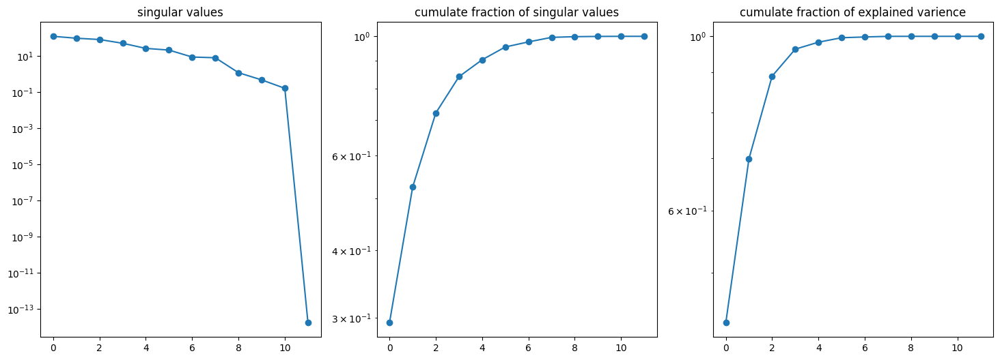

In [5]:
# Compute and plot svd

U_af, s_af, VT_af, labels_af, af_np = compute_and_plot_svd(af)

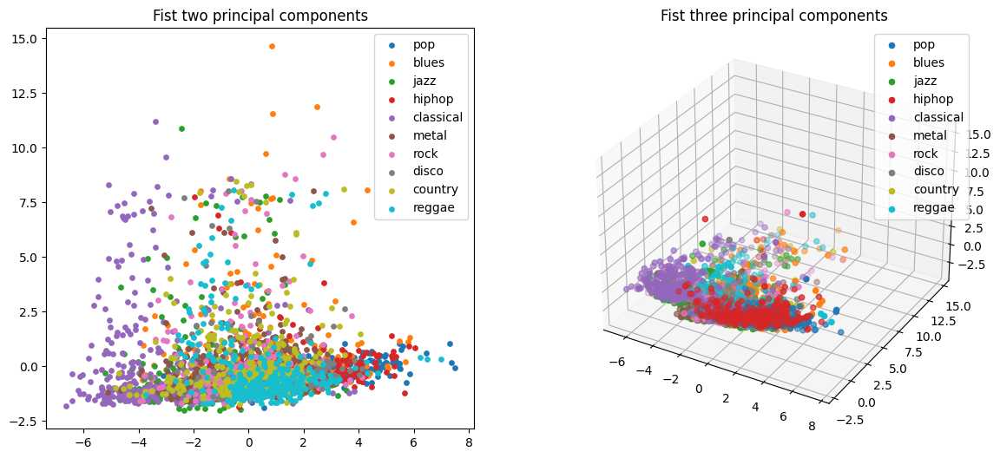

In [6]:
# Compute and plot principal components

pc_af = compute_and_plot_pca(af, af_np, labels_af)

### Spectrum features

In [7]:
spectrum_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/gtzan_spectrum_texture_features.csv'

# sf = load_dataframe_from_csv(spectrum_feature_file)
sf = load_dataframe_from_csv(spectrum_feature_file, True)

Output streaming troncato alle ultime 5000 righe.
[ 2.        +0.00000000e+00j  0.        +0.00000000e+00j
  0.10867312+4.01442069e-01j  0.        +0.00000000e+00j
 -0.1640667 +3.15501684e-01j  0.        +0.00000000e+00j
 -0.27592312-3.89990908e-01j  0.        +0.00000000e+00j
 -0.06924997-1.91526750e-01j  0.        +0.00000000e+00j
 -0.0638    +2.77555756e-17j  0.        +0.00000000e+00j
 -0.06924997+1.91526750e-01j  0.        +0.00000000e+00j
 -0.27592312+3.89990908e-01j  0.        +0.00000000e+00j
 -0.1640667 -3.15501684e-01j  0.        +0.00000000e+00j
  0.10867312-4.01442069e-01j  0.        +0.00000000e+00j]
[ 2.        +0.j          0.        +0.j         -0.0065688 +0.17870008j
  0.        +0.j          0.0234378 +0.23073544j  0.        +0.j
 -0.11859953-0.30189647j  0.        +0.j         -0.15789613+0.0037699j
  0.        +0.j         -0.27141333+0.j          0.        +0.j
 -0.15789613-0.0037699j   0.        +0.j         -0.11859953+0.30189647j
  0.        +0.j          0.023

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0, 22609, 11753, 12313, 21992, 20868, 50499, 26838, 11599, 50188, 9278, 28384, 12888, 26205, 27781, 146375, 15142, 7428, 12844, 2900, 9690, 5267, 8312, 4719, 18176, 3360, 20401, 2856, 7603, 6516, 33566, 3621, 13203, 4776, 3458, 18971, 22062, 872, 3363, 2700, 7748, 1046, 2752, 7285, 31092, 19186, 2731, 2805, 5602, 16806, 1061, 3065, 1972, 14502, 1512, 1058, 2660, 25041, 13712, 8827, 18707, 7676, 7097, 4997, 3480, 6340, 12913, 8049, 20059, 33369, 3126, 3648, 4114, 3424, 3517, 1385, 4805, 2617, 4340, 4771, 15323, 32662, 24201, 3307, 2627, 2984, 4809, 3444, 3084, 21739, 62943, 11183, 2664, 3061, 3284, 9118, 1140, 1321, 6304, 25726, 3619, 18257, 2638, 7043, 13486, 21677, 7813, 29666, 32797, 2904, 21285, 5317, 21877, 4576, 62013, 280, 6395, 2106, 3312, 6242, 20166, 20641, 2689, 5988, 2222, 39091, 16331, 16173, 14720, 24819, 12208, 8759, 24311, 17663, 39919, 335402]
[0, 15687, 8982, 11618, 14970, 16439, 31824, 20966, 8757, 32130, 7071, 21032, 13220, 18965, 19779, 109382, 11493, 6242, 12332,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [8]:
sf.head()

,label_1,label,LBP_mean,LBP_std,LBPHF_mean,LBPHF_std,RICLBP_mean,RICLBP_std,LPQ_mean,LPQ_std
0,reggae_1,reggae,0.1,0.029228,0.785292,2.259987,15850.014706,20059.949377,0.003922,0.003894
1,reggae_2,reggae,0.1,0.028663,0.970014,2.546011,15850.014706,19591.458753,0.003922,0.003917
2,reggae_3,reggae,0.1,0.029574,1.178747,2.783983,15850.014706,19635.933973,0.003922,0.003858
3,reggae_4,reggae,0.1,0.029931,1.229763,2.879402,15850.014706,20101.924173,0.003922,0.003958
4,reggae_5,reggae,0.1,0.049519,0.874138,2.333488,15850.014706,29421.525535,0.003922,0.007190


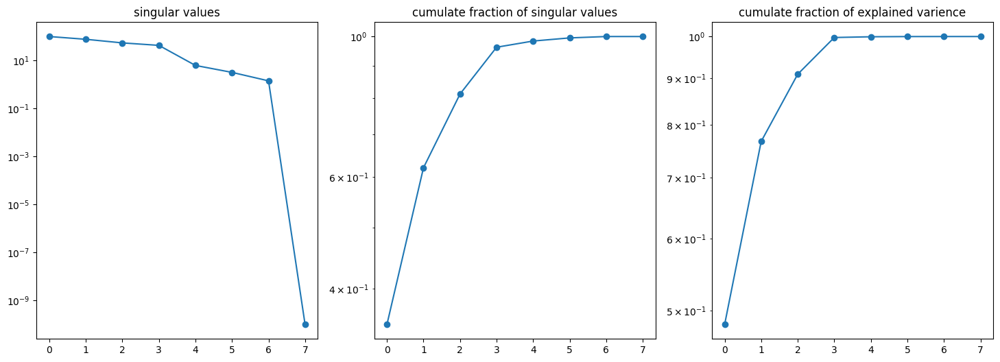

In [9]:
# Compute and plot svd

U_sf, s_sf, VT_sf, labels_sf, sf_np = compute_and_plot_svd(sf)

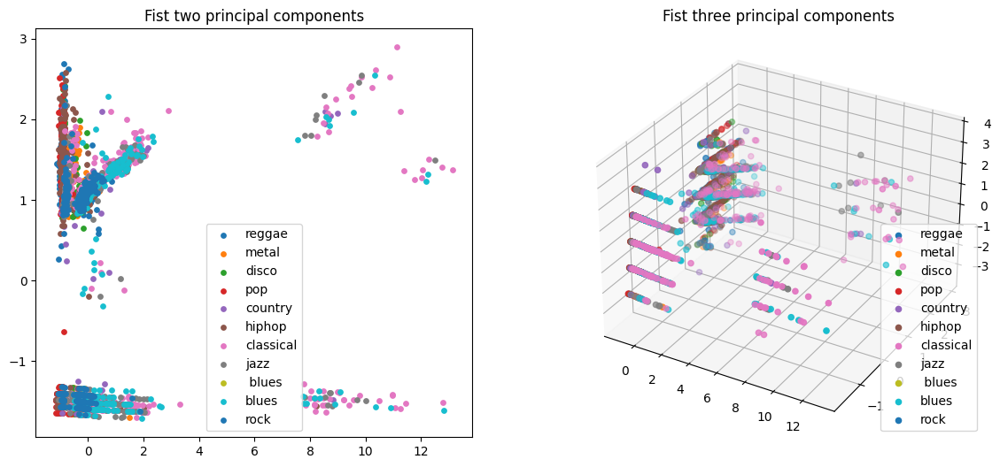

In [10]:
# Compute and plot principal components

pc_sf = compute_and_plot_pca(sf, sf_np, labels_sf)

### AIM features

In [11]:
aim_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/gtzan_aim_texture_features.csv'

aim = load_dataframe_from_csv(aim_feature_file)

Output streaming troncato alle ultime 5000 righe.
 -1.31391979-0.76680774j  0.        +0.j          0.73428075-1.35231817j
  0.        +0.j          0.8239937 +0.j          0.        +0.j
  0.73428075+1.35231817j  0.        +0.j         -1.31391979+0.76680774j
  0.        +0.j         -0.94445066-0.88455247j  0.        +0.j
  0.14842259-1.31963879j  0.        +0.j        ]
[ 2.        +0.j          0.        +0.j          0.11934193+1.31082978j
  0.        +0.j         -0.90553692+0.87597123j  0.        +0.j
 -1.34180528-0.76381432j  0.        +0.j          0.75237334-1.34239897j
  0.        +0.j          0.79939879+0.j          0.        +0.j
  0.75237334+1.34239897j  0.        +0.j         -1.34180528+0.76381432j
  0.        +0.j         -0.90553692-0.87597123j  0.        +0.j
  0.11934193-1.31082978j  0.        +0.j        ]
[ 2.        +0.j          0.        +0.j          0.09101325+1.30910731j
  0.        +0.j         -0.91433045+0.86633671j  0.        +0.j
 -1.32315381-0.7637639

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

<ipython-input-2-de984d145a27>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{col}{i}'] = df[col].apply(lambda x: x[i] if len(x) > i else None)
<ipython-input-2-de984d145a27>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use 

In [12]:
aim.head()

,label_1,label,LBP0,LBP1,LBP2,LBP3,LBP4,LBP5,LBP6,LBP7,...,LPQ500,LPQ501,LPQ502,LPQ503,LPQ504,LPQ505,LPQ506,LPQ507,LPQ508,LPQ509
0,country_1,country,0.000844,0.007049,0.0,0.051002,0.0,0.185876,0.0,0.039452,...,0.0,0.0,3.038652,4.0,8.224617,4.0,6.817924,2.0,2.876590,4.0
1,country_2,country,0.001648,0.010457,0.0,0.059606,0.0,0.165063,0.0,0.040746,...,0.0,0.0,4.780812,4.0,9.926262,4.0,5.756017,2.0,3.281744,4.0
2,country_3,country,0.002407,0.013069,0.0,0.063460,0.0,0.147252,0.0,0.042398,...,0.0,0.0,5.064419,4.0,1.203306,3.0,4.929503,2.0,4.456689,4.0
3,country_4,country,0.001897,0.010714,0.0,0.055379,0.0,0.167020,0.0,0.038789,...,0.0,0.0,3.889474,4.0,8.791832,4.0,5.988575,2.0,3.686897,4.0
4,country_5,country,0.002954,0.012028,0.0,0.059980,0.0,0.155896,0.0,0.041345,...,0.0,0.0,4.456689,4.0,1.134430,3.0,5.378413,2.0,4.861843,4.0


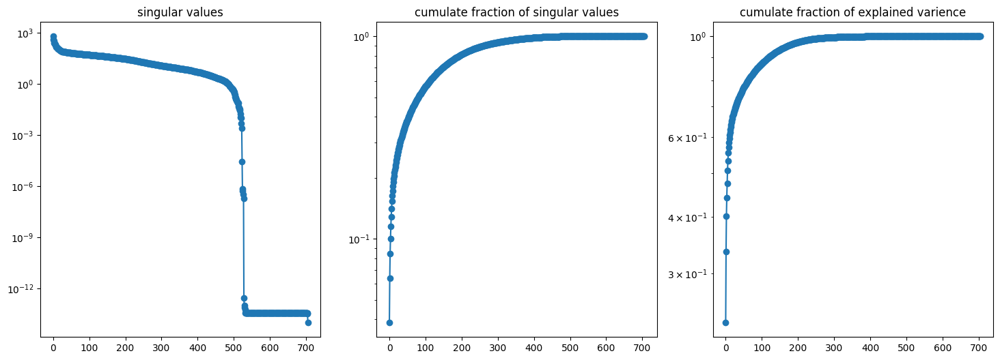

In [13]:
# Compute and plot svd

U_aim, s_aim, VT_aim, labels_aim, aim_np = compute_and_plot_svd(aim)

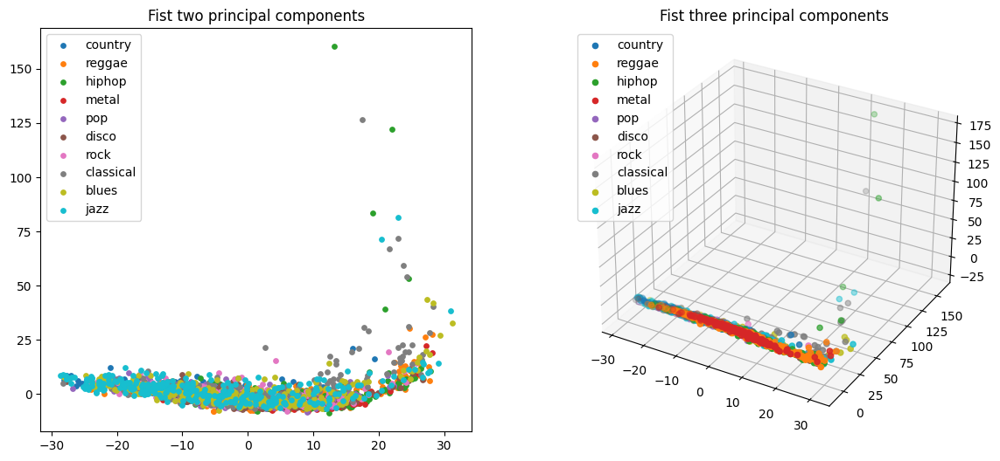

In [14]:
# Compute and plot principal components

pc_aim = compute_and_plot_pca(aim, aim_np, labels_aim)

## Homburg

### Acoustic features

In [ ]:
acoustic_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/homburg_acoustic_features.csv'

af = load_dataframe_from_csv(acoustic_feature_file)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
af.head()

,label_1,label,mfcc0,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,...,trh410,trh411,trh412,trh413,trh414,trh415,trh416,trh417,trh418,trh419
0,raphiphop_1,raphiphop,166.436935,85.045486,14.686680,36.994850,14.541934,22.056189,10.625525,12.536690,...,2.994380,1.064344,1.337250,1.564080,4.656466,6.586946,2.150106,1.214133,1.590089,1.144077
1,raphiphop_2,raphiphop,103.146942,78.321671,12.822082,21.579224,0.290958,12.131853,0.305180,5.738511,...,2.438328,2.764824,1.627416,8.748708,2.594157,2.077989,1.832614,2.927343,3.711595,2.206569
2,raphiphop_3,raphiphop,221.876678,138.258102,55.977940,10.015645,12.944149,11.928767,10.596874,11.007463,...,3.018899,0.691215,1.008897,1.477783,0.631966,2.281606,0.611202,0.779686,2.256325,1.438703
3,raphiphop_4,raphiphop,98.780746,65.228271,12.641401,40.489437,18.354259,12.421285,8.737279,3.535683,...,2.325137,1.450080,1.951654,2.951473,6.314173,3.076992,1.946008,2.275127,1.344984,1.760026
4,raphiphop_5,raphiphop,133.033981,69.331665,21.453009,24.265600,12.431786,0.307681,6.126066,0.909496,...,2.020406,2.113199,2.415876,2.256875,1.498645,3.051895,1.494906,1.264296,2.092077,2.116277


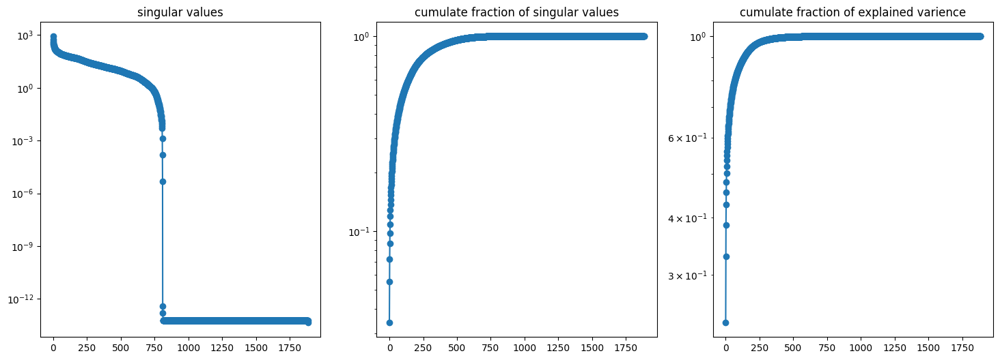

In [ ]:
# Compute and plot svd

U_af, s_af, VT_af, labels_af, af_np = compute_and_plot_svd(af)

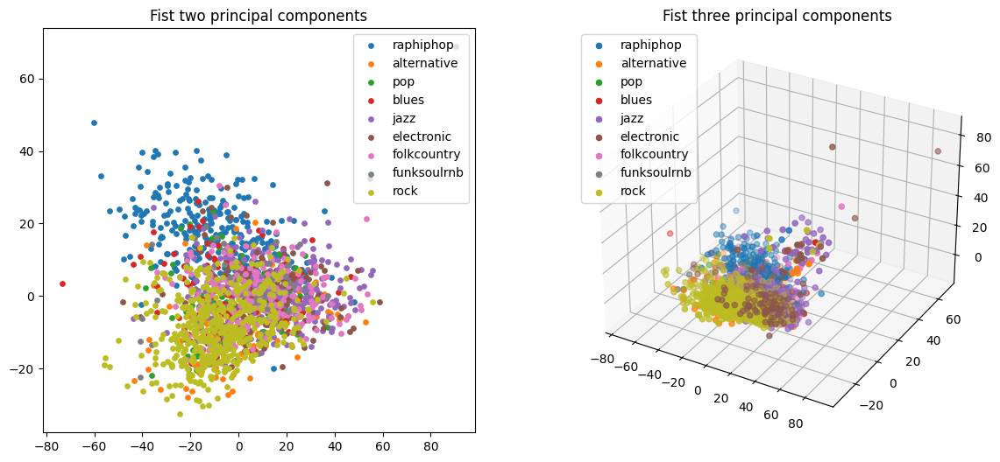

In [ ]:
# Compute and plot principal components

pc_af = compute_and_plot_pca(af, af_np, labels_af)

### Spectrum features

In [ ]:
spectrum_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/homburg_spectrum_texture_features.csv'

sf = load_dataframe_from_csv(spectrum_feature_file)

Output streaming troncato alle ultime 5000 righe.
 -0.09331937+1.80729323e-01j  0.        +0.00000000e+00j
  0.02393857-1.60706347e-01j  0.        +0.00000000e+00j
  0.1316477 -2.48823245e-01j  0.        +0.00000000e+00j]
[ 2.        +0.00000000e+00j  0.        +0.00000000e+00j
  0.14387232+2.50799295e-01j  0.        +0.00000000e+00j
  0.01510457+1.58165527e-01j  0.        +0.00000000e+00j
 -0.10803565-1.36006071e-01j  0.        +0.00000000e+00j
 -0.11557124+3.18863253e-02j  0.        +0.00000000e+00j
 -0.33450667+1.38777878e-17j  0.        +0.00000000e+00j
 -0.11557124-3.18863253e-02j  0.        +0.00000000e+00j
 -0.10803565+1.36006071e-01j  0.        +0.00000000e+00j
  0.01510457-1.58165527e-01j  0.        +0.00000000e+00j
  0.14387232-2.50799295e-01j  0.        +0.00000000e+00j]
[ 2.        +0.j          0.        +0.j          0.13880613+0.24940501j
  0.        +0.j          0.01521368+0.15471376j  0.        +0.j
 -0.08526279-0.20593843j  0.        +0.j         -0.14771368+0.048026

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

<ipython-input-48-3be53d6e3df1>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{col}{i}'] = df[col].apply(lambda x: x[i] if len(x) > i else None)
<ipython-input-48-3be53d6e3df1>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [ ]:
sf.head()

,label_1,label,LBP0,LBP1,LBP2,LBP3,LBP4,LBP5,LBP6,LBP7,...,LPQ245,LPQ246,LPQ247,LPQ248,LPQ249,LPQ250,LPQ251,LPQ252,LPQ253,LPQ254
0,pop_1,pop,0.074107,0.126662,0.049655,0.072185,0.104983,0.101262,0.059618,0.127340,...,0.000788,0.000677,0.000798,0.000653,0.000826,0.000581,0.000721,0.002264,0.003229,0.003279
1,pop_2,pop,0.076170,0.118392,0.052962,0.076563,0.099398,0.106688,0.063558,0.119888,...,0.000831,0.000705,0.000731,0.000715,0.000799,0.000591,0.000732,0.002200,0.003919,0.003138
2,pop_3,pop,0.076718,0.120138,0.052900,0.075572,0.096383,0.104525,0.063403,0.122550,...,0.000808,0.000731,0.000791,0.000653,0.000794,0.000585,0.000752,0.002311,0.003465,0.003338
3,pop_4,pop,0.072253,0.117180,0.051365,0.077555,0.104880,0.110390,0.064597,0.118758,...,0.000798,0.000597,0.000788,0.000684,0.000821,0.000612,0.000632,0.002074,0.003267,0.002999
4,pop_5,pop,0.071448,0.124268,0.050450,0.074242,0.106267,0.105990,0.061140,0.124242,...,0.000779,0.000640,0.000712,0.000618,0.000784,0.000570,0.000712,0.001964,0.004373,0.003185


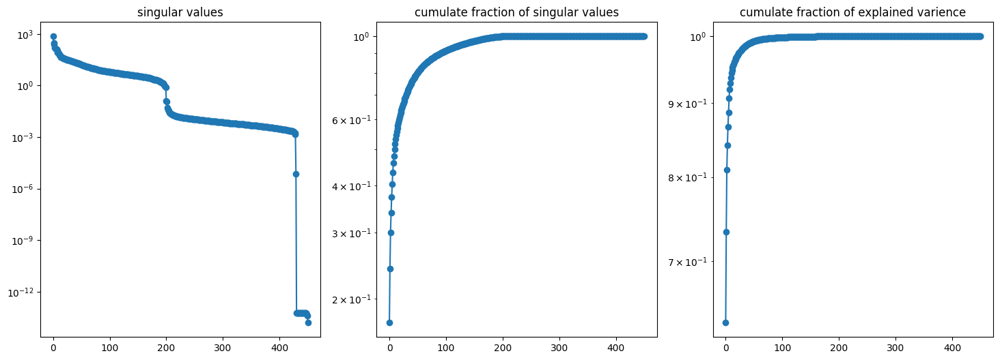

In [ ]:
# Compute and plot svd

U_sf, s_sf, VT_sf, labels_sf, sf_np = compute_and_plot_svd(sf)

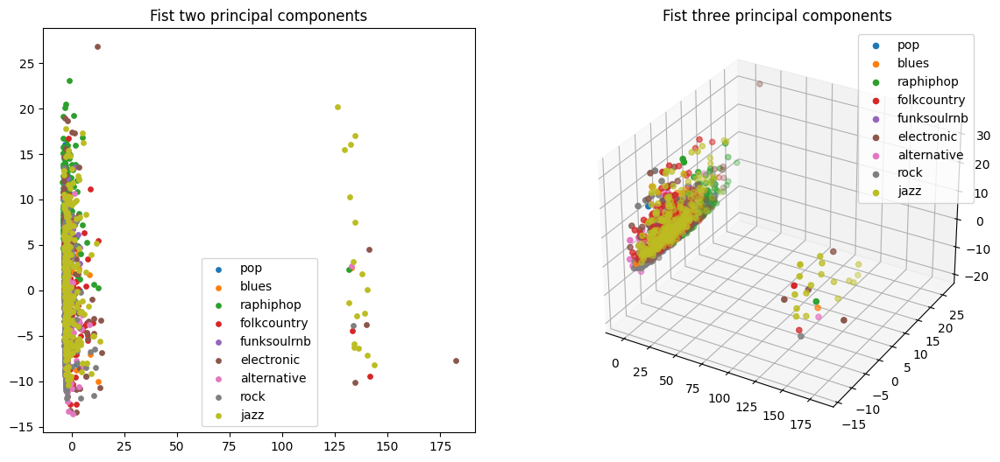

In [ ]:
# Compute and plot principal components

pc_sf = compute_and_plot_pca(sf, sf_np, labels_sf)

### AIM features

In [ ]:
aim_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/homburg_aim_texture_features.csv'

aim = load_dataframe_from_csv(aim_feature_file)

Output streaming troncato alle ultime 5000 righe.
  0.77942498-1.33133858e+00j  0.        +0.00000000e+00j
  0.78549383-5.55111512e-17j  0.        +0.00000000e+00j
  0.77942498+1.33133858e+00j  0.        +0.00000000e+00j
 -1.33759588+7.68416282e-01j  0.        +0.00000000e+00j
 -0.90146314-8.64159902e-01j  0.        +0.00000000e+00j
  0.08686044-1.31022517e+00j  0.        +0.00000000e+00j]
[ 2.        +0.j          0.        +0.j          0.09012842+1.32471532j
  0.        +0.j         -0.91042503+0.86665239j  0.        +0.j
 -1.35345066-0.78394248j  0.        +0.j          0.78561391-1.34600328j
  0.        +0.j          0.81613297+0.j          0.        +0.j
  0.78561391+1.34600328j  0.        +0.j         -1.35345066+0.78394248j
  0.        +0.j         -0.91042503-0.86665239j  0.        +0.j
  0.09012842-1.32471532j  0.        +0.j        ]
[ 2.        +0.00000000e+00j  0.        +0.00000000e+00j
  0.09916669+1.31672631e+00j  0.        +0.00000000e+00j
 -0.93848518+8.70469140e-01j 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

<ipython-input-48-3be53d6e3df1>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'{col}{i}'] = df[col].apply(lambda x: x[i] if len(x) > i else None)
<ipython-input-48-3be53d6e3df1>:33: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [ ]:
aim.head()

,label_1,label,LBP0,LBP1,LBP2,LBP3,LBP4,LBP5,LBP6,LBP7,...,LPQ500,LPQ501,LPQ502,LPQ503,LPQ504,LPQ505,LPQ506,LPQ507,LPQ508,LPQ509
0,folkcountry_1,folkcountry,0.003689,0.015235,0.0,0.057344,0.0,0.148827,0.0,0.037893,...,0.0,0.0,4.254112,4.0,8.062556,4.0,5.286038,2.0,8.062556,4.0
1,folkcountry_2,folkcountry,0.005168,0.016746,0.0,0.062548,0.0,0.137655,0.0,0.037527,...,0.0,0.0,5.145450,4.0,1.053399,3.0,4.629690,2.0,5.429058,4.0
2,folkcountry_3,folkcountry,0.003890,0.016135,0.0,0.057722,0.0,0.143261,0.0,0.037748,...,0.0,0.0,5.145450,4.0,1.126327,3.0,4.920590,2.0,7.130703,4.0
3,folkcountry_4,folkcountry,0.003203,0.013977,0.0,0.057806,0.0,0.152014,0.0,0.036768,...,0.0,0.0,3.605867,4.0,8.062556,4.0,5.431894,2.0,5.793696,4.0
4,folkcountry_5,folkcountry,0.002234,0.012129,0.0,0.063955,0.0,0.147312,0.0,0.043085,...,0.0,0.0,4.618751,4.0,1.170894,3.0,4.972855,2.0,4.618751,4.0


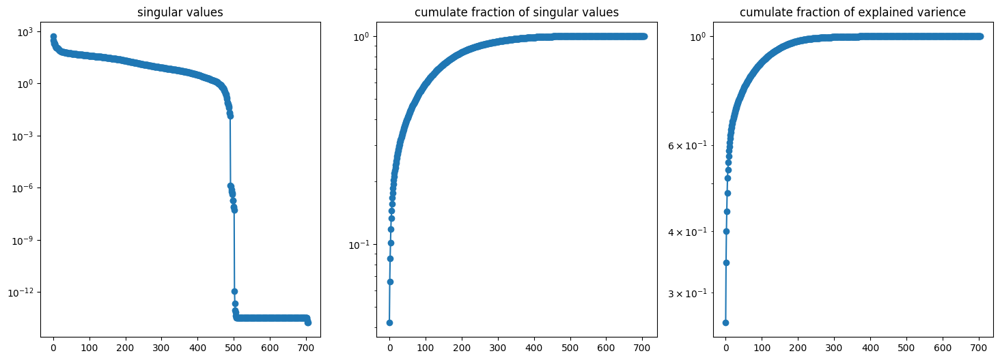

In [ ]:
# Compute and plot svd

U_aim, s_aim, VT_aim, labels_aim, aim_np = compute_and_plot_svd(aim)

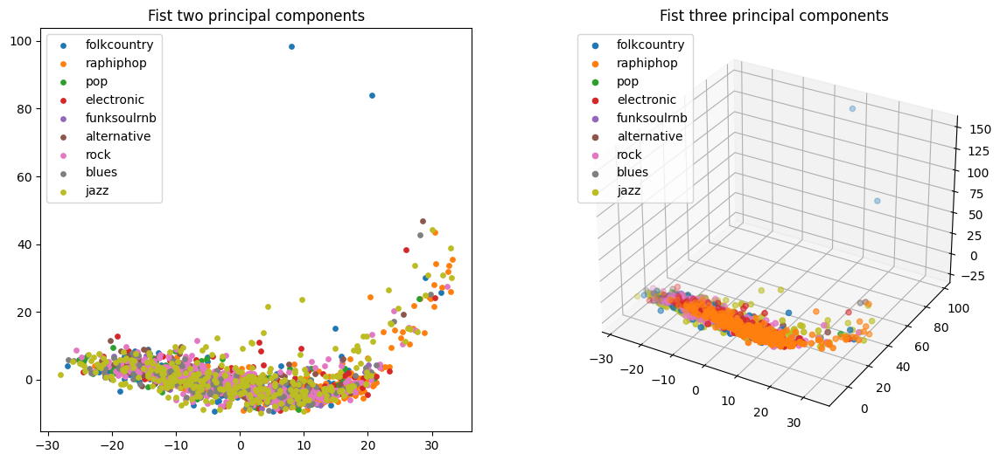

In [ ]:
# Compute and plot principal components

pc_aim = compute_and_plot_pca(aim, aim_np, labels_aim)

## Ismir2004

### Acoustic features

In [ ]:
acoustic_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/ismir2004_acoustic_features.csv'

af = load_dataframe_from_csv(acoustic_feature_file)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
af.head()

,label_1,label,mfcc0,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,...,trh410,trh411,trh412,trh413,trh414,trh415,trh416,trh417,trh418,trh419
0,punk_1,punk,11.937013,71.134346,11.437682,25.586664,5.470666,3.337891,1.273769,2.269456,...,2.205135,1.576496,1.530504,1.406786,1.730699,1.813526,1.264457,1.377351,1.976929,1.630243
1,punk_2,punk,4.154061,74.897720,29.990070,32.053211,2.555988,5.343979,0.600543,11.464440,...,1.531202,2.031163,1.502756,2.158440,3.128893,4.004682,2.150624,2.746660,2.889900,2.212517
2,punk_3,punk,57.706036,79.464355,16.567841,30.480808,16.748726,10.144359,10.536179,15.474321,...,1.704760,2.713128,1.682737,2.971333,2.974580,2.323765,1.870046,1.633576,1.592276,1.953762
3,punk_4,punk,9.432040,72.167374,6.107736,38.649651,1.751942,4.940056,2.365243,9.691849,...,1.442404,1.172668,0.863329,1.607802,1.106440,2.459141,1.739156,1.439455,1.474481,1.238956
4,punk_5,punk,3.867364,76.601219,29.950989,31.261015,1.479375,6.771141,1.880208,11.360884,...,1.303003,2.260123,1.871878,2.833420,4.627750,3.114666,3.274636,1.897449,2.189709,2.221895


In [ ]:
# Compute and plot svd

U_af, s_af, VT_af, labels_af, af_np = compute_and_plot_svd(af)

In [ ]:
# Compute and plot principal components

pc_af = compute_and_plot_pca(af, af_np, labels_af)

### Spectrum features

In [ ]:
spectrum_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/ismir2004_spectrum_texture_features.csv'

sf = load_dataframe_from_csv(spectrum_feature_file)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
sf.head()

,label_1,label,LBP0,LBP1,LBP2,LBP3,LBP4,LBP5,LBP6,LBP7,...,LPQ245,LPQ246,LPQ247,LPQ248,LPQ249,LPQ250,LPQ251,LPQ252,LPQ253,LPQ254
0,pop_1,pop,0.075305,0.115862,0.055307,0.078788,0.096540,0.107727,0.065800,0.118647,...,0.000866,0.000687,0.000757,0.000664,0.000789,0.000597,0.000724,0.002121,0.003618,0.003227
1,pop_2,pop,0.069793,0.104125,0.058168,0.089303,0.094827,0.119300,0.071170,0.108055,...,0.000866,0.000632,0.000836,0.000655,0.000846,0.000550,0.000767,0.001940,0.003815,0.003063
2,pop_3,pop,0.068133,0.118400,0.048728,0.076738,0.106978,0.108413,0.061185,0.117743,...,0.000806,0.000578,0.000789,0.000600,0.000848,0.000548,0.000731,0.001795,0.004539,0.002999
3,pop_4,pop,0.074087,0.124117,0.049740,0.073805,0.105613,0.104132,0.060735,0.125337,...,0.000844,0.000667,0.000788,0.000593,0.000781,0.000595,0.000710,0.002270,0.003465,0.003257
4,pop_5,pop,0.064205,0.098155,0.055727,0.090255,0.097467,0.123542,0.069352,0.099238,...,0.000804,0.000674,0.000793,0.000491,0.000829,0.000543,0.000741,0.001689,0.004400,0.003158


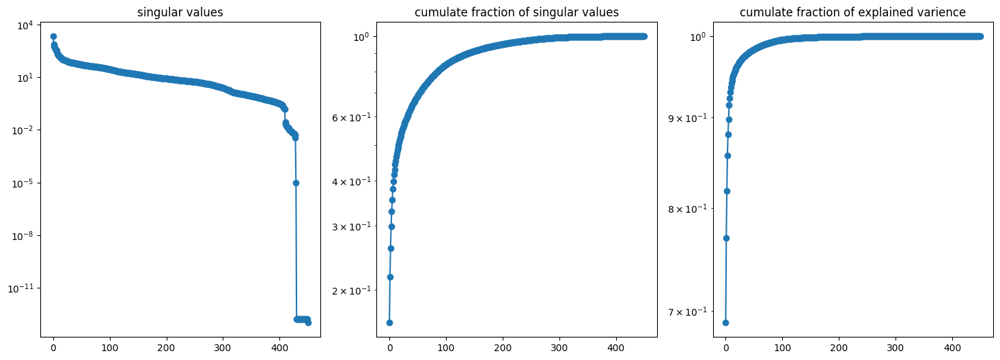

In [ ]:
# Compute and plot svd

U_sf, s_sf, VT_sf, labels_sf, sf_np = compute_and_plot_svd(sf)

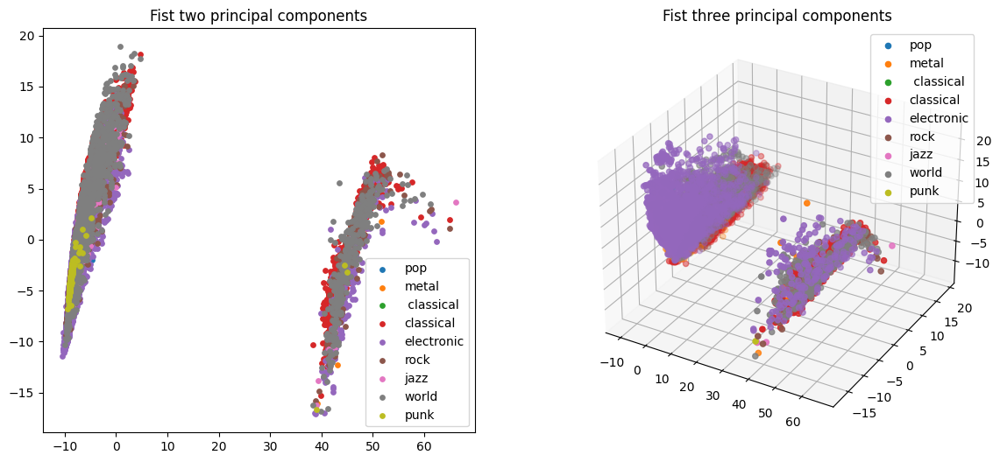

In [ ]:
# Compute and plot principal components

pc_sf = compute_and_plot_pca(sf, sf_np, labels_sf)

### AIM features

In [ ]:
aim_feature_file = '/content/drive/MyDrive/Università/NAML_project/datasets_processed/ismir2004_aim_texture_features.csv'

aim = load_dataframe_from_csv(aim_feature_file)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
aim.head()

,label_1,label,LBP0,LBP1,LBP2,LBP3,LBP4,LBP5,LBP6,LBP7,...,LPQ500,LPQ501,LPQ502,LPQ503,LPQ504,LPQ505,LPQ506,LPQ507,LPQ508,LPQ509
0,metal_1,metal,0.003488,0.015959,0.0,0.058586,0.0,0.144226,0.0,0.038588,...,0.0,0.0,5.753180,4.0,1.187100,3.0,4.886152,2.0,6.077303,4.0
1,metal_2,metal,0.001503,0.010320,0.0,0.059703,0.0,0.157202,0.0,0.045231,...,0.0,0.0,4.173082,4.0,1.061502,3.0,5.477271,2.0,4.092051,4.0
2,metal_3,metal,0.006687,0.023196,0.0,0.061282,0.0,0.121194,0.0,0.035213,...,0.0,0.0,4.456689,4.0,9.440078,4.0,4.012641,2.0,8.710801,4.0
3,metal_4,metal,0.001632,0.009432,0.0,0.054133,0.0,0.171642,0.0,0.040156,...,0.0,0.0,3.848959,4.0,8.751317,4.0,6.228426,2.0,5.185965,4.0
4,metal_5,metal,0.001784,0.010855,0.0,0.057979,0.0,0.167487,0.0,0.037696,...,0.0,0.0,5.145450,4.0,1.102018,3.0,5.914432,2.0,3.362774,4.0


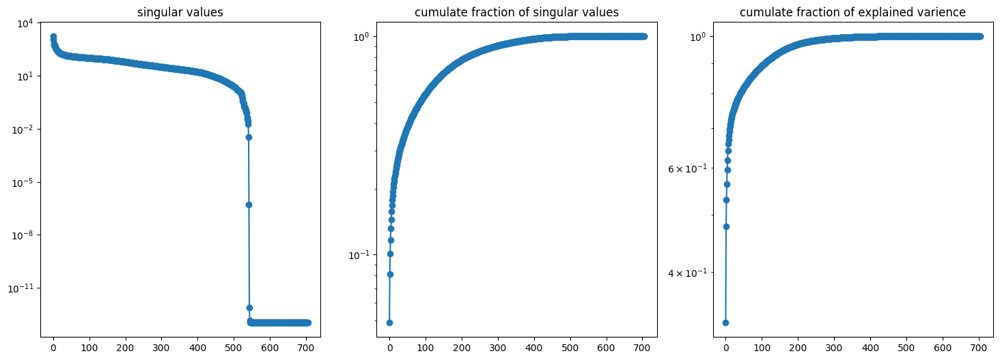

In [ ]:
# Compute and plot svd

U_aim, s_aim, VT_aim, labels_aim, aim_np = compute_and_plot_svd(aim)

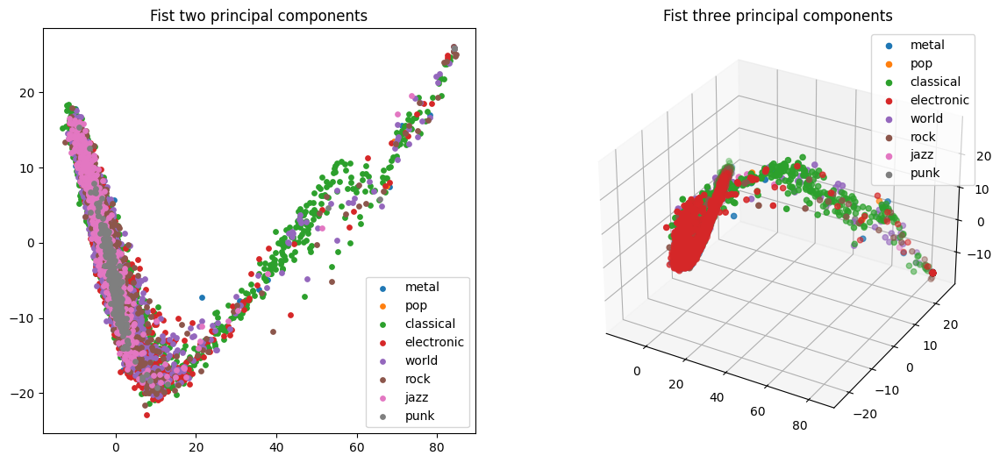

In [ ]:
# Compute and plot principal components

pc_aim = compute_and_plot_pca(aim, aim_np, labels_aim)